# FIFA BALLON D'OR 2019 (Soccer)

Who is the best player is the world?? No matter which city you live in, which country you are from, which club you support,  every passionate supporter of the game has an answer to this question. Yes, every person might have their own hero but to broadly answer this, each year in the month of December journalists, football(soccer) coaches, national team captains all vote for who they think had the most impact in the year and the award "Ballon d'or Player of the Year" is given to the person with the most votes. While some still debate if this is the right way to decide, why don't we explore what the statistics say? because the numbers do not LIE.

Historically this award is completely dominated by forwards who are goal scorers. An important trait of an attacking player is to not only make chances for himself and score goals, but also to make chances to teammates so that they can score. This is measured by 'Assist'. A player has an 'Assist' when his pass leads to scoring of the goal. Goals and Assists are key parameters that measures how good a player is, it measures both creative and goal scoring ability. So let us explore who has the most 'Goals' and 'Assists' accross top 5 major leagues in Europe and the best player will most certainly be playing in one of this leagues.

Now that we have know we are measuring two quantities which are qualitative in nature, SCATTER PLOTS are the best way to represent them. Now there are many libraries that allow scatter plots as it is a very basic plot. So the choice of the library will be based on further interactivity the plot can provide. 
Let us see some basic plots from 'bokeh', 'altair', 'seaborn', plot.ly. 
The second goal of this notebook is to get a better understanding of one these libraries

# Selecting Visualization Library

## Bokeh

In [1]:
from bokeh.plotting import figure, show
import pandas as pd
import random
import numpy as np
import bokeh.plotting as bpl
import bokeh.models as bmo
bpl.output_notebook()

x = [x for x in np.random.randint(1,10,10)]

y = [x for x in np.random.randint(10,20,10)]
TOOLS="hover,crosshair,pan,wheel_zoom,zoom_in,zoom_out,box_zoom,undo,redo,reset,tap,save,box_select,poly_select,lasso_select,"
p = bpl.figure(tools=TOOLS)
p.scatter(x,y)
bpl.show(p)

Loading BokehJS ...

## Altair

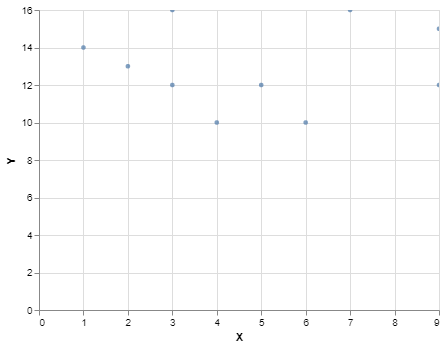

In [2]:
import altair as alt
alt.renderers.enable('notebook')
X = [x for x in np.random.randint(1,10,10)]

Y = [x for x in np.random.randint(10,20,10)]

df = pd.DataFrame({'X':X, 'Y':Y})

alt.Chart(df).mark_circle(size=20).encode(x= 'X', y='Y', tooltip=['X','Y']).interactive()


## Seaborn

In [3]:
import seaborn as sns
X = [x for x in np.random.randint(1,10,10)]

Y = [x for x in np.random.randint(10,20,10)]

ax = sns.scatterplot(x=X, y= Y)

## Plot.ly

In [4]:
import plotly.express as px

X = [x for x in np.random.randint(1,10,10)]

Y = [x for x in np.random.randint(10,20,10)]
df = pd.DataFrame({'X':X, 'Y':Y})

fig = px.scatter(df, x='X', y='Y')
fig.show()

Based on the initial scatter plots for the above libraries, I felt Plot.ly library was easy to understand and the interactivity is built in, as you hover over close the data it immediately displays the data, it automatically sized the figure better, the hovering data displayed is good and easy to read. Seaborn did not have interactive scatter plots that can be easily implementable. Altair and Bokeh plots are interactive, but Altair plots lag a bit on showing hovering data and upon inspecting the docs of all the libraries, for scatterplots Plot.ly had nice interactions like the color of the hovering data changes as per the color given to the data etc. While Altair, Bokeh and Plot.ly would serve our purpose as we are inspecting small data, I am gonna go with Plot.ly

Based on the intial plots below is the summary.

Bokeh:
 1. Plots are interactive (data displayed while hovering)
 2. Easy to plot 
 
Altair:
 1. Plots are interactive
 2. Need better understanding of the library to plot
 3. Hovering data is not as good as Bokeh, gets stuck sometimes, maybe with deeper dive it can be fixed.
 
Seaborn:
 1. No interactivity easily available
 2. Very Easy to plot
 3. Can be used to quickly have a look the data
 
Plot.ly
 1. Plots are interactive.
 2. Easy to plot
 3. Image resizes automatically
 
 The decision came to between Bokeh and plot.ly, i liked how the hovering data is displayed in plot.ly, by reading the documentation felt there is more to learn about this library and hence plot.ly is selected. More information of Plot.ly library is given below.

## Plot.ly

Plotly is a technical computing company headquartered in Montreal, Quebec, that develops online data analytics and visualization tools. Plotly provides online graphing, analytics, and statistics tools for individuals and collaboration, as well as scientific graphing libraries for Python, R, MATLAB, Perl, Julia, Arduino, and REST. Plotly was founded by Alex Johnson, Jack Parmer, Chris Parmer, and Matthew Sundquist. The founders' backgrounds are in science, energy, and data analysis and visualization.

Here is the link to its wiki page https://en.wikipedia.org/wiki/Plotly

It is integratable to Jupyter and interactivity is optimised for jupyter notebook applications

#### Installation

$ pip install plotly==4.3.0

$ conda install -c plotly plotly=4.3.0

# Data Collection and Cleaning

Now as we know the library we are going to use, let's get the data we are looking for

Now we have to collect goals and assists data from top 5 European Leagues. The goal is pull top 5 players with highest goals+assists count. The five leagues are
 1. English Premier League - England
 2. LaLiga - Spain
 3. Seria A - Italy
 4. Bundesliga - Germany
 5. Ligue 1 - France

Wikipedia has information about goals and assists, lets try to pull them out

In [6]:
import pandas as pd
df_laliga = pd.read_html('https://en.wikipedia.org/wiki/2018%E2%80%9319_La_Liga', header=0)
df_laliga_goals = df_laliga[8]
df_laliga_assists = df_laliga[9]
df_laliga_assists

,Rank,Player,Club,Assists
0,1,Lionel Messi,Barcelona,13
1,1,Pablo Sarabia,Sevilla,13
2,3,Santi Cazorla,Villarreal,10
3,3,Jony,Alavés,10
4,5,Wissam Ben Yedder,Sevilla,9
5,5,José Campaña,Levante,9
6,5,Antoine Griezmann,Atlético Madrid,9
7,8,Jordi Alba,Barcelona,8
8,9,Moi Gómez,Huesca,7
9,9,Brais Méndez,Celta Vigo,7


We have goals and assists seperately, we could find assists for all the goal scorer, or merge on Names but it would be nice if get a CSV file which has all the data together.

After searching through websites, found the english premier league data in https://footystats.org/download-stats-csv# and downloaded the data. let's explore and find what we need

### English Premier League

In [7]:
df_england = pd.read_csv('Premier_2018-19.csv', header=0) # can comment all the below lines and start uncommenting one by one
# to understand the process followed.
df_england.head() # have a look what is in the dataframe
df_england = df_england[['full_name', 'goals_overall', 'assists_overall']] # Keep only necessary columns.
df_england.dtypes # to understand the dtypes and what functions to apply.
df_england['goal+assist'] = df_england['goals_overall']+df_england['assists_overall'] # we need the sum to pull the top 5
df_england = df_england.sort_values('goal+assist', ascending = False) # sorting to pull the top 5
df_england = df_england.iloc[:5] # keeping only the top 5 and removing everything else
df_england # looks like we have our required data for england

,full_name,goals_overall,assists_overall,goal+assist
174,Eden Hazard,16,15,31
261,Mohamed Salah,22,8,30
351,Sergio Aguero,21,8,29
352,Raheem Sterling,17,10,27
334,Pierre-Emerick Aubameyang,22,5,27


### Laliga - Spanish League

Turns out only english premier league data is free from the website. Lets change our approach from finding downloadable data to a website which has the required data and try to pull that data.

In [8]:
df = pd.read_html('https://www.foxsports.com/soccer/stats?competition=2&season=20180&category=STANDARD&pos=0&team=0&isOpp=0&sort=4&sortOrder=0&page=1')
# Found the website and using pandas read_html to read the tables.
df_spain = df[0] # the first table is what we are looking for. Can comment all the lines below and uncomment one by one
df_spain.head() # intial exploration
df_spain = df_spain[['STANDARD', 'G', 'A']] # Keeping only required data
df_spain['goal+assist']=df_spain['G']+df_spain['A'] # Need the combined score
df_spain = df_spain.sort_values('goal+assist', ascending = False) # sorting to get the top 5
df_spain = df_spain[:5] # Keeping only the top 5
df_spain['STANDARD'] = df_spain['STANDARD'].apply(lambda x:x.split(',')[1]) # Cleaning the names column to keep only correct data
df_spain # looks like we have our required data for Laliga

C:\Users\ankit\Anaconda3\envs\basic\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,STANDARD,G,A,goal+assist
0,Lionel Messi,36,13,49
15,Luis Suarez,21,6,27
5,Wissam Ben Yedder,18,9,27
9,Iago Aspas,20,7,27
17,Karim Benzema,21,6,27


### Bundesliga - German League

Following the same approach as above

In [9]:
df_german = pd.read_html('https://www.foxsports.com/soccer/stats?competition=4&season=20180&category=standard&sort=4')[0]
# Can skip the first step in spanish table by directly telling what table you want after the link.
df_german.head()
df_german = df_german[['STANDARD', 'G', 'A']]
df_german['goal+assist']=df_german['G']+df_german['A']
df_german = df_german.sort_values('goal+assist', ascending = False)
df_german = df_german[:5]
df_german['STANDARD'] = df_german['STANDARD'].apply(lambda x:x.split(',')[1])
df_german # looks like we have our required data for Bundesliga

,STANDARD,G,A,goal+assist
17,Robert Lewandowski,22,7,29
0,Jadon Sancho,12,14,26
9,Marco Reus,17,8,25
8,Sebastian Haller,15,9,24
29,Wout Weghorst,17,6,23


### Seria A - Italian League

Same approach as above

In [10]:
df_italy = pd.read_html('https://www.foxsports.com/soccer/stats?competition=3&season=20180&category=STANDARD&pos=0&team=0&isOpp=0&sort=5&sortOrder=0&page=1')[0]
df_italy.head()
df_italy = df_italy[['STANDARD', 'G', 'A']]
df_italy['goal+assist']=df_italy['G']+df_italy['A']
df_italy = df_italy.sort_values('goal+assist', ascending = False)
df_italy = df_italy[:5]
df_italy
# Now the naming standard is not the same, The third name is not seperated by a ',', so the usual split will not work here
df_italy.at[0,'STANDARD'] = '1  Cristiano Ronaldo, Cristiano Ronaldo,  JUV' # I decided to just manually change the name
# as it is just one change. if it was many, could have explored how to extract what is required using regex.
df_italy['STANDARD'] = df_italy['STANDARD'].apply(lambda x:x.split(',')[1])
df_italy # looks like we have our required data for Seria A

,STANDARD,G,A,goal+assist
1,Fabio Quagliarella,26,8,34
2,Duvan Zapata,23,7,30
0,Cristiano Ronaldo,21,7,28
14,Dries Mertens,16,10,26
4,Krzysztof Piatek,22,0,22


### Ligue 1 - French League

The website we used for did not have assists data in it. Could not find other websites which have both information in one table. Found one website which had the table for combined goals and assists. So the approach is use that table and filter top 5. Find goals for those top 5. Substract goals+ assists by goals to get Assists data.

In [31]:
df_france_1 = pd.read_html('https://www.foxsports.com/soccer/stats?competition=43&season=20180&category=STANDARD')[0]
df_france_1.head() # first dataframe which has goals information.
df_france_2 = pd.read_html('https://fbref.com/en/comps/13/2104/2018-2019-Ligue-1-Stats')[3] # The table number keeps changing
# based on how the page is opened. if there is an error please change the table number until you get the goals+assists table
df_france_2.head() # Second dataframe which has combined goals+assists data
df_france_2 = df_france_2[:5] # keeping only the top 5 as the data is already sorted.

df_france_2 = df_france_2.rename(columns={1: 'Names', 2: 'goal+assist'}) # renaming columns
df_france_2['Names'] = df_france_2['Names'].apply(lambda x:x.split('•')[0]) # formating 'Names' column to keep only required data
df_france_1 = df_france_1.iloc[[0,1,3,2,11]] # retaining only data for people in df_france_2 dataframe in the required order
df_france_1['STANDARD'] = df_france_1['STANDARD'].apply(lambda x:x.split(', ')[1]) # This step is not necessary
df_france_2 = df_france_2.reset_index().drop(columns=[0,'index']) # Dropping unecessary columns.

df_france_2['G'] = list(df_france_1['G']) # Adding the goals data
df_france_2['A'] = df_france_2['goal+assist']-df_france_2['G'] # Finding the assits values
df_france =  df_france_2
df_france #looks like we have our required data for Ligue 1- French

,Names,goal+assist,G,A
0,Kylian Mbappé,40,33,7
1,Nicolas Pépé,33,22,11
2,Florian Thauvin,24,16,8
3,Edinson Cavani,23,18,5
4,Ángel Di María,23,12,11


### Final Formatting

In [32]:
df_england = df_england.rename(columns={'full_name': 'Names', 'goals_overall':'G', 'assists_overall': 'A'})
df_spain = df_spain.rename(columns={'STANDARD': 'Names'}) # renaming columns such that all data have the same name
df_german = df_german.rename(columns={'STANDARD': 'Names'})
df_italy = df_italy.rename(columns={'STANDARD': 'Names'})
df_france['League']='French (Ligue-1)' # adding which league the data is coming from will be useful for having different colors
df_england['League']='English Premier League'
df_german['League'] = 'German (Bundesliga)'
df_spain['League'] = 'Spanish (LaLiga)'
df_italy['League'] = 'Italian (Seria A)'

df_final = pd.concat([df_england, df_italy, df_german, df_spain, df_france]) # Making all the seperate dataframes into one
df_final = df_final.reset_index().drop(columns=['index'])
df_final =  df_final.rename(columns={'A': 'Assists', 'G': 'Goals', 'Names':'Name'}) # Renaming columns as necessary
df_final # This is our final data

C:\Users\ankit\Anaconda3\envs\basic\lib\site-packages\ipykernel_launcher.py:11: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




,Assists,Goals,League,Name,goal+assist
0,15,16,English Premier League,Eden Hazard,31
1,8,22,English Premier League,Mohamed Salah,30
2,8,21,English Premier League,Sergio Aguero,29
3,10,17,English Premier League,Raheem Sterling,27
4,5,22,English Premier League,Pierre-Emerick Aubameyang,27
5,8,26,Italian (Seria A),Fabio Quagliarella,34
6,7,23,Italian (Seria A),Duvan Zapata,30
7,7,21,Italian (Seria A),Cristiano Ronaldo,28
8,10,16,Italian (Seria A),Dries Mertens,26
9,0,22,Italian (Seria A),Krzysztof Piatek,22


# Plotting our Data

In [33]:
import plotly.express as px
import plotly.graph_objects as go

fig = px.scatter(df_final, x='Assists', y='Goals')#, color = 'League', hover_data=['Name'])
fig.show()


This chart basically the chart we wanted, however I beleive we can make this better. Let us explore on how to make this better.

In [45]:
fig = go.Figure()
fig = px.scatter(df_final, x='Assists', y='Goals', color = 'League', size='Goals', hover_data=['Name'])
fig.update_layout(template="plotly_white")
fig.show()

# it is nice how the beckgroud color of the hover data also changes with the color of the ball.

Scatter plot can also be plotted using go. Scatter, for large data Scattergl is used. go Scatter can be used plot mutiple traces together in one plot. Scattergl is used for big data. Plot.ly is especially good in handling large data.

In [57]:
import plotly.graph_objects as go
import pandas as pd

data= df_final

fig = go.Figure(data=go.Scatter(x=data['Assists'],
                                y=data['Goals'],
                                mode='markers',
                                marker_color=data['Goals'],
                                text=data['Name'])) # hover text goes here

fig.update_layout(title="Player's performance")
fig.show()

In [58]:
# Small unrelated example for large data
N = 100000
fig = go.Figure(data=go.Scattergl(
    x = np.random.randn(N),
    y = np.random.randn(N),
    mode='markers',
    marker=dict(
        color=np.random.randn(N),
        colorscale='Viridis',
        line_width=1
    )
))

fig.show()

You can see that the rendering is quite beautiful and plot.ly handles large data sets very well.

## Summary

We can see from the above chart that there is one person who stands out in the top right portion of the chart, Lionel Messi!!. He clearly has the most impact on the games he has played. Based on our small data analysis, the Ballon d'or Player of the year goes to Lionel Messi. Lets wait and see if this becomes true.

![title](Messi.JPG)

### Dependencies

Libraries
1. Bokeh
2. pandas
3. Altair
4. plotly
5. Seaborn

Websites

1. https://www.foxsports.com/soccer/stats
2. https://en.wikipedia.org/wiki/2018%E2%80%9319_La_Liga
3. https://fbref.com/en/comps/13/2104/2018-2019-Ligue-1-Stats

### Rule et al's rules

Below are the list of rules that I tried to adhere in the notebook

1. Tell a story for an audience: The story i picked is Ballond'or 2019, an award given to the best soccer player every year.

2. Document the process: Have documented how i collected data, even steps which were dead ends, like reading wiki page are also documented.

3. Use cell division to make steps clear: Have throughout the notebook used enough cells to indicate change of context, it terms of the narrative story or in terms of code.

4. Record dependencies : Have recorded dependencies in the end of the notebook

Can improve:
One area I would like to improve is to make the code more modular using functions.